# PISA 2012 Dataset Exploration
## by Laila Shahareen

## Preliminary Wrangling

> PISA is a survey of students' skills and knowledge as they
approach the end of compulsory education. It is not a
conventional school test. Rather than examining how well
students have learned the school curriculum, it looks at how
well prepared they are for life beyond school.
Around 510,000 students in 65 economies took part in the
PISA 2012 assessment of reading, mathematics and science
representing about 28 million 15-year-olds globally. Of those
economies, 44 took part in an assessment of creative problem
solving and 18 in an assessment of financial literacy.
 
> Out of many variables, I selected 24 columns and later reduced the number according to the requirement of my queries and tried to clean the dataset for faster execution.

In [141]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

%matplotlib inline

# suppress warnings from final output
import warnings
warnings.simplefilter("ignore")

> Let's load in PISA dataset and describe its properties through the questions below.

In [142]:
df = pd.read_csv('pisa2012.csv',encoding='ISO-8859-1')

In [143]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 485490 entries, 0 to 485489
Columns: 636 entries, Unnamed: 0 to VER_STU
dtypes: float64(250), int64(18), object(368)
memory usage: 2.3+ GB


In [144]:
df.shape

(485490, 636)

>From above wrangling steps, we see that the PISA data is really huge. The main dataset contains 485490 rows and 636 columns. In order to be familiar with the variables, there is another file(pisadict2012.csv) we can look into.

In [145]:
variables_pisa = pd.read_csv('pisadict2012.csv',encoding='ISO-8859-1')
variables_pisa

,Unnamed: 0,x
0,CNT,Country code 3-character
1,SUBNATIO,Adjudicated sub-region code 7-digit code (3-di...
2,STRATUM,Stratum ID 7-character (cnt + region ID + orig...
3,OECD,OECD country
4,NC,National Centre 6-digit Code
...,...,...
630,W_FSTR80,FINAL STUDENT REPLICATE BRR-FAY WEIGHT80
631,WVARSTRR,RANDOMIZED FINAL VARIANCE STRATUM (1-80)
632,VAR_UNIT,RANDOMLY ASSIGNED VARIANCE UNIT
633,SENWGT_STU,Senate weight - sum of weight within the count...


> Still we cannot fathom all the variables at a time. So, my next step is to get assistance from Atom where I can open the csv file and easily go through the description of the variables. My primary goal is to figure out the variables related to the performance of students on designed category of subjects i.e. mathematics, science and reading . So, before we spend longer on finding our features of interest, it would be a better idea to read the test design and scaling PISA data part for clear meaning of those variables [here](http://www.oecd.org/pisa/data/pisa2012database-downloadabledata.htm). The scaling of PISA data clarifies why the plausible value in mathematics, science, reading and subscale of math content are valid score to analyse students' performance.

### What is the structure of your dataset?

> There are 485490 students' performance in the dataset with 636 features.  There are 268  variables those are numeric in nature. Due to the complex nature of these dataset, I am mostly interested in pupil performance in mathematics, reading and science those are coded by plausible values. 

> You can find them in columns: PV1MATH-PV5MATH (for math), PV1READ-PV5READ (for reading) and PV1SCIE-PV5SCIE (for science). For given area all five values PV1- PV5 are just independent estimations of the student performance in given area. 

> The rest of the features are object type. 

### What is/are the main feature(s) of interest in your dataset?

> There are way too many features to consider. I am curious about the following three questions.
* Are there differences in achievement based on teacher practices and attitudes?
* Are there differences in achievement based on gender, location, or student attitudes?
* Does socio-economic status matter?

I decided to explore the performance related dependent variables such as plausible value in mathematics, science and reading. First, we will explore univariate feature and then bivariate exploration followed by multivariate exploration.  

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

> My expectation is that plausible values in math, science and reading would be strongly related to the resources avaiable to individual student. One of the prime resources is teacher in their school. The mentor-student relationship and their style towards teaching would be a good start to answer my first question. 

>PV1MATH-PV5MATH, PV1READ-PV5READ,PV1SCIE-PV5SCIE(Plausible value in all categories) are dependent varaiables.

> The following variables can be considered as direct measures of teacher's attitudes, practices and approaches on teaching. For sake of simplicity, I am going to consider the below variables.

>"TCHBEHFA","Teacher Behaviour: Formative Assessment"
"STUDREL","Teacher Behaviour: Teacher Student Relations"
"TEACHSUP","Teacher Support"

>To answer the second question in regard to location, gender and students' attitude, the following variables are important.
"OUTHOURS","Out-of-School Study Time"
"CNT", Location
"ST04Q01","Gender of Student"
'SMINS':'Learning Time Science','LMINS':'Learning Time Language','MMINS':'Learning Time Math'

>"ESCS","Index of economic, social and cultural status" can shed some light on socio-economic status of students' and their achievement.


In [146]:
#Only necessary columns for our analysis are kept.
df = df[['CNT','ST04Q01','OUTHOURS','PV1MATH','PV2MATH',
         'PV3MATH', 'PV4MATH', 'PV5MATH', 'PV1READ', 'PV2READ',
         'PV3READ', 'PV4READ', 'PV5READ', 'PV1SCIE', 'PV2SCIE', 'PV3SCIE',
         'PV4SCIE', 'PV5SCIE', 'TCHBEHFA','STUDREL','ESCS','TEACHSUP','SMINS','LMINS','MMINS']]

In [147]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 485490 entries, 0 to 485489
Data columns (total 25 columns):
CNT         485490 non-null object
ST04Q01     485490 non-null object
OUTHOURS    308799 non-null float64
PV1MATH     485490 non-null float64
PV2MATH     485490 non-null float64
PV3MATH     485490 non-null float64
PV4MATH     485490 non-null float64
PV5MATH     485490 non-null float64
PV1READ     485490 non-null float64
PV2READ     485490 non-null float64
PV3READ     485490 non-null float64
PV4READ     485490 non-null float64
PV5READ     485490 non-null float64
PV1SCIE     485490 non-null float64
PV2SCIE     485490 non-null float64
PV3SCIE     485490 non-null float64
PV4SCIE     485490 non-null float64
PV5SCIE     485490 non-null float64
TCHBEHFA    314678 non-null float64
STUDREL     313860 non-null float64
ESCS        473648 non-null float64
TEACHSUP    316371 non-null float64
SMINS       270914 non-null float64
LMINS       282866 non-null float64
MMINS       283303 non-null

In [148]:
df.head()

,CNT,ST04Q01,OUTHOURS,PV1MATH,PV2MATH,PV3MATH,PV4MATH,PV5MATH,PV1READ,PV2READ,...,PV3SCIE,PV4SCIE,PV5SCIE,TCHBEHFA,STUDREL,ESCS,TEACHSUP,SMINS,LMINS,MMINS
0,Albania,Female,NaN,406.8469,376.4683,344.5319,321.1637,381.9209,249.5762,254.3420,...,348.2283,367.8105,392.9877,1.3625,-1.04,NaN,1.68,NaN,NaN,NaN
1,Albania,Female,8.0,486.1427,464.3325,453.4273,472.9008,476.0165,406.2936,349.8975,...,471.5964,443.6218,454.8116,NaN,NaN,NaN,NaN,90.0,315.0,270.0
2,Albania,Female,24.0,533.2684,481.0796,489.6479,490.4269,533.2684,401.2100,404.3872,...,492.2044,512.7191,499.6643,NaN,NaN,NaN,NaN,NaN,300.0,NaN
3,Albania,Female,17.0,412.2215,498.6836,415.3373,466.7472,454.2842,547.3630,481.4353,...,448.9370,474.1141,426.5573,0.7644,NaN,NaN,1.68,90.0,135.0,135.0
4,Albania,Female,NaN,381.9209,328.1742,403.7311,418.5309,395.1628,311.7707,141.7883,...,372.7527,403.5248,422.1746,0.7644,-0.02,NaN,0.11,NaN,NaN,NaN


In [149]:
#view missing values

df.isnull().sum()

CNT              0
ST04Q01          0
OUTHOURS    176691
PV1MATH          0
PV2MATH          0
PV3MATH          0
PV4MATH          0
PV5MATH          0
PV1READ          0
PV2READ          0
PV3READ          0
PV4READ          0
PV5READ          0
PV1SCIE          0
PV2SCIE          0
PV3SCIE          0
PV4SCIE          0
PV5SCIE          0
TCHBEHFA    170812
STUDREL     171630
ESCS         11842
TEACHSUP    169119
SMINS       214576
LMINS       202624
MMINS       202187
dtype: int64

In [150]:
#Drop duplicate and null values
df.drop_duplicates(inplace=True)
df.dropna(inplace=True)

In [151]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 124974 entries, 4761 to 485481
Data columns (total 25 columns):
CNT         124974 non-null object
ST04Q01     124974 non-null object
OUTHOURS    124974 non-null float64
PV1MATH     124974 non-null float64
PV2MATH     124974 non-null float64
PV3MATH     124974 non-null float64
PV4MATH     124974 non-null float64
PV5MATH     124974 non-null float64
PV1READ     124974 non-null float64
PV2READ     124974 non-null float64
PV3READ     124974 non-null float64
PV4READ     124974 non-null float64
PV5READ     124974 non-null float64
PV1SCIE     124974 non-null float64
PV2SCIE     124974 non-null float64
PV3SCIE     124974 non-null float64
PV4SCIE     124974 non-null float64
PV5SCIE     124974 non-null float64
TCHBEHFA    124974 non-null float64
STUDREL     124974 non-null float64
ESCS        124974 non-null float64
TEACHSUP    124974 non-null float64
SMINS       124974 non-null float64
LMINS       124974 non-null float64
MMINS       124974 non-n

In [152]:
# Find the mean score for all subjects and drop the unnecessary columns

df['Avg Math Score'] = (df['PV1MATH'] + df['PV2MATH'] + df['PV3MATH'] + df['PV4MATH'] + df['PV5MATH']) / 5
df['Avg Reading Score'] = (df['PV1READ'] + df['PV2READ'] + df['PV3READ'] + df['PV4READ'] + df['PV5READ']) / 5
df['Avg Science Score'] = (df['PV1SCIE'] + df['PV2SCIE'] + df['PV3SCIE'] + df['PV4SCIE'] + df['PV5SCIE']) / 5

df.drop(columns=['PV1MATH', 'PV2MATH', 'PV3MATH', 'PV4MATH', 'PV5MATH', 'PV1READ', 'PV2READ', 'PV3READ', 'PV4READ',
                 'PV5READ', 'PV1SCIE', 'PV2SCIE', 'PV3SCIE', 'PV4SCIE', 'PV5SCIE'], inplace=True)

In [153]:
#Rename the columns

df.rename({'CNT': 'Country', 'ST04Q01': 'Gender',
           'STUDREL': 'Teacher Student Relations', 'TCHBEHFA': 'Formative Assesment',
           'OUTHOURS': 'Out_of_School Study Time',
           'Avg Science Score': 'Average Science Score',
           'Avg Math Score': 'Average Math Score',
           'Avg Reading Score': 'Average Reading Score',
           'ESCS': 'Socio_economic_cultural Status',
          'TEACHSUP':'Teacher Support','SMINS':'Learning Time Science','LMINS':'Learning Time Language','MMINS':'Learning Time Math'}, axis='columns', inplace=True)

In [154]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 124974 entries, 4761 to 485481
Data columns (total 13 columns):
Country                           124974 non-null object
Gender                            124974 non-null object
Out_of_School Study Time          124974 non-null float64
Formative Assesment               124974 non-null float64
Teacher Student Relations         124974 non-null float64
Socio_economic_cultural Status    124974 non-null float64
Teacher Support                   124974 non-null float64
Learning Time Science             124974 non-null float64
Learning Time Language            124974 non-null float64
Learning Time Math                124974 non-null float64
Average Math Score                124974 non-null float64
Average Reading Score             124974 non-null float64
Average Science Score             124974 non-null float64
dtypes: float64(11), object(2)
memory usage: 13.3+ MB


In [155]:
df.head()

,Country,Gender,Out_of_School Study Time,Formative Assesment,Teacher Student Relations,Socio_economic_cultural Status,Teacher Support,Learning Time Science,Learning Time Language,Learning Time Math,Average Math Score,Average Reading Score,Average Science Score
4761,United Arab Emirates,Male,28.0,0.7644,-0.79,0.20,-0.28,135.0,225.0,225.0,383.55662,295.89948,389.53750
4770,United Arab Emirates,Male,17.0,2.6295,1.51,0.33,1.68,180.0,270.0,270.0,382.46612,291.08780,387.85898
4772,United Arab Emirates,Male,12.0,-0.2859,0.45,-0.01,-0.47,0.0,540.0,240.0,280.42530,306.00398,319.22790
4777,United Arab Emirates,Male,7.0,-0.0092,0.45,0.81,0.97,300.0,350.0,250.0,483.96166,502.07954,462.83104
4778,United Arab Emirates,Male,8.0,0.5054,0.81,0.93,0.34,300.0,450.0,250.0,406.45740,445.86318,399.98138


## Univariate Exploration
> I'll start by looking at the distribution of the main variable of interest: Mean score in each case would be best to start with.

> For first question, let's do the countplot for student's average math score, average science score and average reading score.
> In this section, I've investigated the distributions of individual variables. 

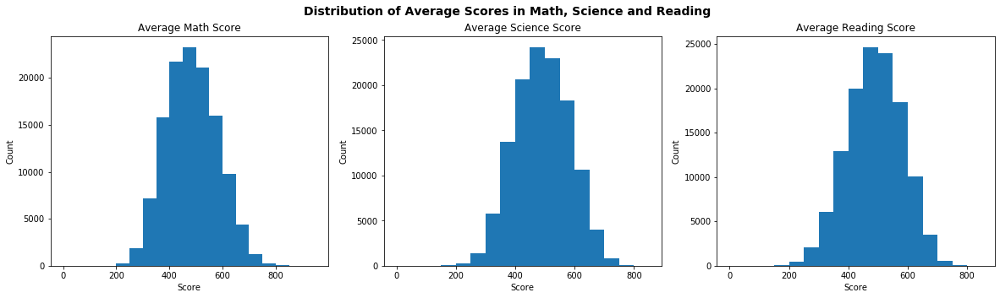

In [203]:

fig, ax = plt.subplots(ncols=3, figsize = [20,5])
binsize = 50
variables = ['Average Math Score', 'Average Science Score', 'Average Reading Score']
for i in range(len(variables)):
    var = variables[i]
    bins = np.arange(0, max(df[var])+binsize, binsize)
    ax[i].hist(data = df, x = var, bins = bins)
    ax[i].set_xlabel('Score')
    ax[i].set_ylabel('Count')
    ax[i].set_title('{}'.format(var))

plt.suptitle('Distribution of Average Scores in Math, Science and Reading', fontsize =14, weight ='bold')
plt.show();

>From the three plots above on math, science and reading score it looks like the distribution for math score falls in normal distribution. Science and reading score are slightly skewed towards left. The boxplot would give clearest idea about the percentile and median data for the variables. Let's create boxplot. 

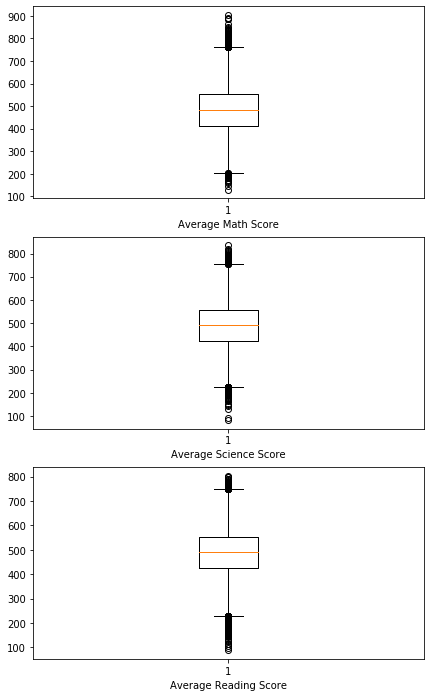

In [157]:
#create boxplot for all three variables
fig, ax = plt.subplots(nrows=3, figsize = [7,12])
variables = ['Average Math Score', 'Average Science Score', 'Average Reading Score']
for i in range(len(variables)):
    var = variables[i]
    ax[i].boxplot(data = df, x = var)
    ax[i].set_xlabel('{}'.format(var))


>Since the distributions are pretty much normal, we can move onto study time variable.First we will consider out of school study hours.The index OUTHOURS was computed by summing the time spent studying for school
subjects and it is consisted of homework
guided homework, personal tutor,commercial company,with parent and computer.

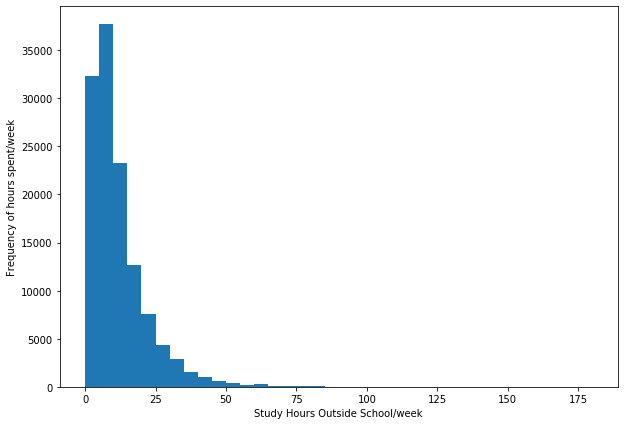

In [158]:
binsize = 5
bins = np.arange(0, df['Out_of_School Study Time'].max()+binsize, binsize)

plt.figure(figsize=[10,7])
plt.hist(data = df, x = 'Out_of_School Study Time', bins = bins)
plt.xlabel('Study Hours Outside School/week')
plt.ylabel('Frequency of hours spent/week')
plt.show()

> This is highly skewed towards right and I think looking at the statistics would be best to comment further. After 35 hrs, the frequency really diminishes and we can say that majority of students from our dataset have shown their effort outside school. Let's do the log transformation for hours.


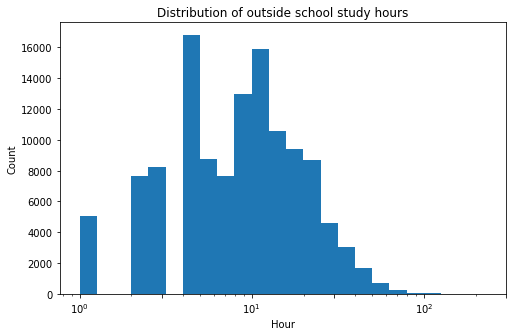

In [159]:
# there's a long tail in the distribution, so let's put it on a log scale instead
log_binsize = 0.1
bins = 10 ** np.arange(0, np.log10(df['Out_of_School Study Time'].max())+log_binsize, log_binsize)

plt.figure(figsize=[8, 5])
plt.hist(data = df, x = 'Out_of_School Study Time', bins = bins)
plt.xscale('log')
plt.xticks([1,3,10,30,100,300])
plt.xlabel('Hour')
plt.ylabel('Count')
plt.title('Distribution of outside school study hours')
plt.show()

In [160]:
df['Out_of_School Study Time'].describe()

count    124974.000000
mean         11.158753
std          10.272592
min           0.000000
25%           4.000000
50%           8.000000
75%          15.000000
max         180.000000
Name: Out_of_School Study Time, dtype: float64

> Now, we can move onto study the learning time spent on each subject after school.Learning time in test language (LMINS) was computed by multiplying the number of minutes on average in the test language class by number of test language class periods per week (ST69 and ST70). Comparable indices were computed for mathematics (MMINS) and science (SMINS).

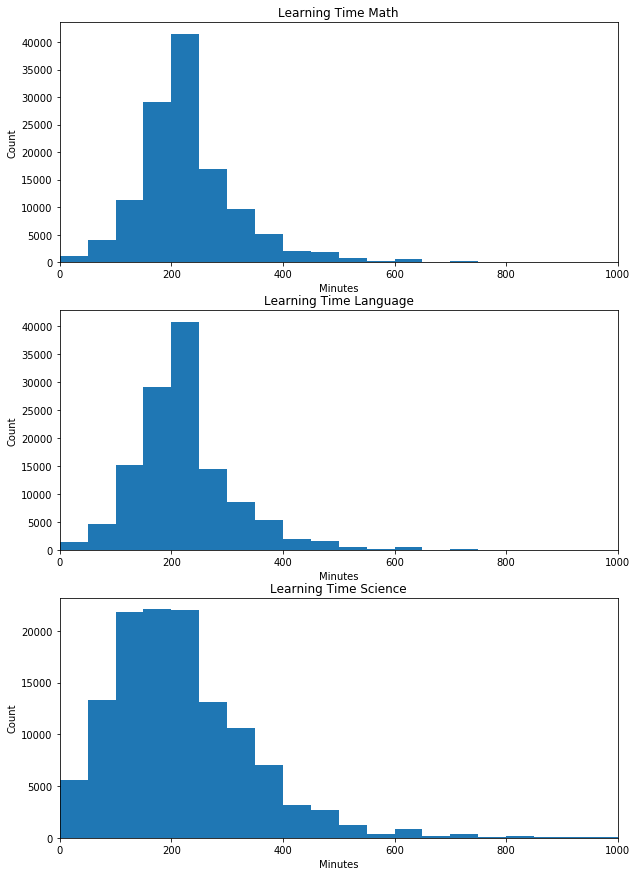

In [161]:
#fig, ax = plt.subplots(nrows=3, figsize = [10,15])
#binsize = 50
#variables = ['Learning Time Math','Learning Time Language','Learning Time Science']
#for i in range(len(variables)):
   # var = variables[i]
    #bins = np.arange(min(df[var]), max(df[var])+binsize, binsize)
    #ax[i].hist(data = df, x = var, bins = bins)
    #ax[i].set_xlabel('Minutes')
    #ax[i].set_ylabel('Count')
    #ax[i].set_title('{}'.format(var))
    #ax[i].set_xlim(0, 1000)
#plt.suptitle('Distribution of formative assesment,teacher support and teacher student relations amon students')
#plt.show()


fig, ax = plt.subplots(nrows=3, figsize = [10,15])
binsize = 50
variables = ['Learning Time Math','Learning Time Language','Learning Time Science']
for i in range(len(variables)):
    var = variables[i]
    bins = np.arange(0, df[var].max()+binsize, binsize)
    ax[i].hist(data = df, x = var, bins = bins)
    ax[i].set_xlabel('Minutes')
    ax[i].set_ylabel('Count')
    ax[i].set_title('{}'.format(var))
    ax[i].set_xlim(0, 1000)

plt.show()

> The math and lierature ditribution match with the unimodal and normal distribution. For Science we can see a clear right skew.Since all of the Learning Time variables have values that are beyond 600 minutes, and these values might distort our later plots, we should analyze them and determine if it makes sense to disregard them.
    


In [162]:
# Select high outliers for the learning time total, using criteria eyeballed from the plot
high_outliers_math = (df['Learning Time Math'] > 600)

print(high_outliers_math.sum())
print(df.loc[high_outliers_math,:])

772
                         Country  Gender  Out_of_School Study Time  \
4930        United Arab Emirates    Male                      37.0   
5062        United Arab Emirates  Female                      13.0   
5128        United Arab Emirates    Male                      24.0   
5349        United Arab Emirates  Female                      15.0   
5353        United Arab Emirates  Female                       4.0   
...                          ...     ...                       ...   
479975  United States of America    Male                      11.0   
480954                   Vietnam  Female                      22.0   
483110                   Vietnam  Female                      45.0   
483885                   Vietnam    Male                       7.0   
484450                   Vietnam    Male                      48.0   

        Formative Assesment  Teacher Student Relations  \
4930                 0.5054                       1.13   
5062                -0.5945            

we will consider Math teaching,

In [163]:
high_outliers_language = (df['Learning Time Language'] > 600)

print(high_outliers_language.sum())
print(df.loc[high_outliers_language,:])

599
                         Country  Gender  Out_of_School Study Time  \
5062        United Arab Emirates  Female                      13.0   
5355        United Arab Emirates  Female                       4.0   
5356        United Arab Emirates  Female                       1.0   
5679        United Arab Emirates  Female                      43.0   
5969        United Arab Emirates  Female                      12.0   
...                          ...     ...                       ...   
479161  United States of America    Male                       7.0   
480067  United States of America    Male                       6.0   
480325  United States of America    Male                       8.0   
480404  United States of America    Male                       3.0   
480468  United States of America  Female                      21.0   

        Formative Assesment  Teacher Student Relations  \
5062                -0.5945                      -0.79   
5355                 0.7644            

In [164]:
high_outliers_science = (df['Learning Time Science'] > 600)

print(high_outliers_science.sum())
print(df.loc[high_outliers_science,:])

1341
                     Country  Gender  Out_of_School Study Time  \
4911    United Arab Emirates    Male                       5.0   
4928    United Arab Emirates    Male                      15.0   
4930    United Arab Emirates    Male                      37.0   
5022    United Arab Emirates  Female                      17.0   
5038    United Arab Emirates  Female                      28.0   
...                      ...     ...                       ...   
483110               Vietnam  Female                      45.0   
483196               Vietnam    Male                      11.0   
483941               Vietnam    Male                      26.0   
485233               Vietnam  Female                      40.0   
485362               Vietnam    Male                      13.0   

        Formative Assesment  Teacher Student Relations  \
4911                 0.2509                      -0.02   
4928                -0.0092                      -0.02   
4930                 0.5054 

In [165]:
# Remove outliers
df = df.loc[-high_outliers_math & -high_outliers_language & -high_outliers_science,:]

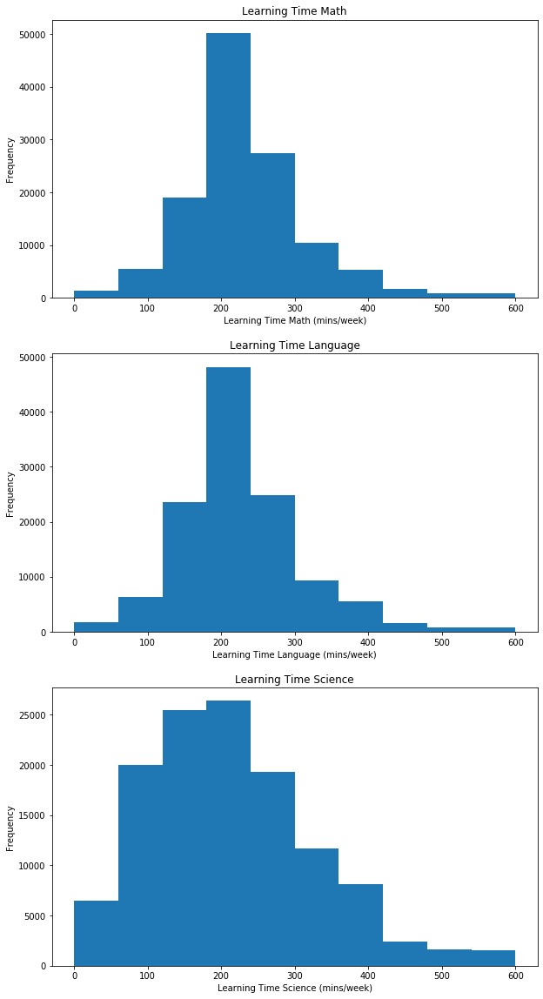

In [166]:
# Re-plotting the distributions of Learning Times
fig, ax = plt.subplots(nrows=3, figsize = [10,20])

variables = ['Learning Time Math', 'Learning Time Language', 'Learning Time Science']
for i in range(len(variables)):
    var = variables[i]
    ax[i].hist(data = df, x = var)
    ax[i].set_xlabel('{} (mins/week)'.format(var))
    ax[i].set_ylabel('Frequency')
    ax[i].set_title('{}'.format(var))


plt.show()

> We still have location,gender,teachers' practices and attitudes(Formative Assesment,Teacher Student Relations,Socio_economic_cultural Status,Teacher Support) to analyse.

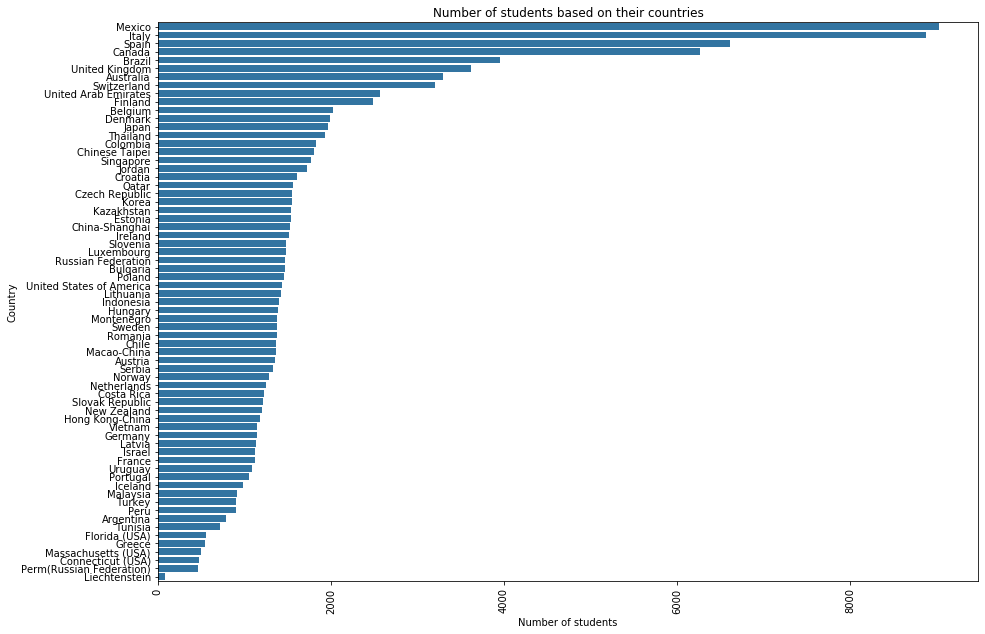

In [167]:
# Find number of students from different countries
plt.figure(figsize = [14.7,10.27])
base_color = sb.color_palette()[0]
sb.countplot(data = df, y = 'Country', color = base_color, order=df['Country'].value_counts().index,orient="h")
plt.title('Number of students based on their countries')
plt.xticks(rotation='vertical');
plt.xlabel('Number of students');

In [168]:
df.Country.value_counts()

Mexico                      9027
Italy                       8874
Spain                       6614
Canada                      6270
Brazil                      3952
                            ... 
Greece                       545
Massachusetts (USA)          499
Connecticut (USA)            481
Perm(Russian Federation)     459
Liechtenstein                 87
Name: Country, Length: 67, dtype: int64

>From the above plot, it is clear that there are few countries with several name. United States of America,and Massachusetts (USA), Florida(USA), Connecticut(USA), China-Shanghai, Hong-Kong-China, Macao-China are, Chinese Taipei are repeatation and it would be better to visualize them as a single country. So I will convert them to appropriate country.

In [169]:
    
# this will replace the incorrect names with correct one 
df.replace({'Country': {'Connecticut (USA)': 'USA', 'Florida (USA)': 'USA','Massachusetts (USA)': 'USA','United States of America': 'USA',
                       'Hong Kong-China':'China', 'China-Shanghai':'China', 'Macao-China':'China','Macao':'China','Hong Kong':'China','Czech Republic':'Czech',
                       'Czechia':'Czech','Korea, Republic of':'Korea','United States':'USA','Chinese Taipei':'Taiwan'}},inplace = True)  
#replace_names_with_correct_ones()

In [170]:
df.Country.value_counts()

Mexico                      9027
Italy                       8874
Spain                       6614
Canada                      6270
China                       4073
                            ... 
Argentina                    786
Tunisia                      716
Greece                       545
Perm(Russian Federation)     459
Liechtenstein                 87
Name: Country, Length: 62, dtype: int64

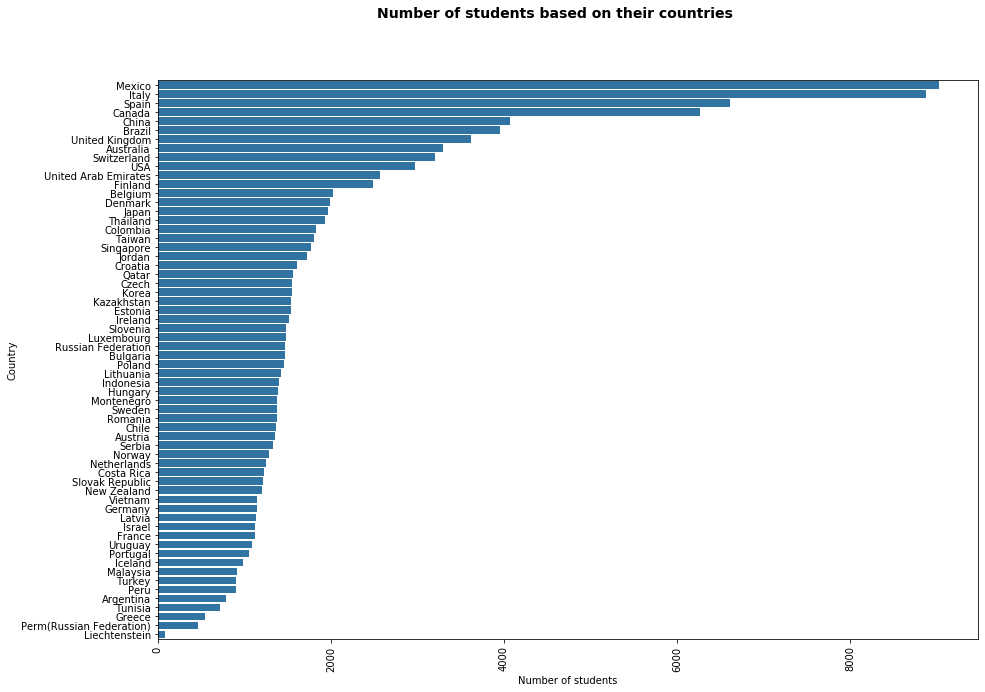

In [204]:
# Find number of students from different countries
plt.figure(figsize = [14.7,10.27])
base_color = sb.color_palette()[0]
sb.countplot(data = df, y = 'Country', color = base_color, order=df['Country'].value_counts().index,orient="h")
plt.suptitle('Number of students based on their countries',fontsize = 14, weight ='bold')
plt.xticks(rotation='vertical');
plt.xlabel('Number of students');

In [172]:
df[['Teacher Support','Formative Assesment','Teacher Student Relations']].describe()

,Teacher Support,Formative Assesment,Teacher Student Relations
count,122895.000000,122895.000000,122895.000000
mean,0.135252,0.078359,0.100092
std,1.016349,1.015271,1.023516
min,-2.920000,-2.391900,-3.110000
25%,-0.470000,-0.594500,-0.480000
50%,0.110000,-0.009200,-0.020000
75%,0.970000,0.764400,0.810000
max,1.680000,2.629500,2.160000


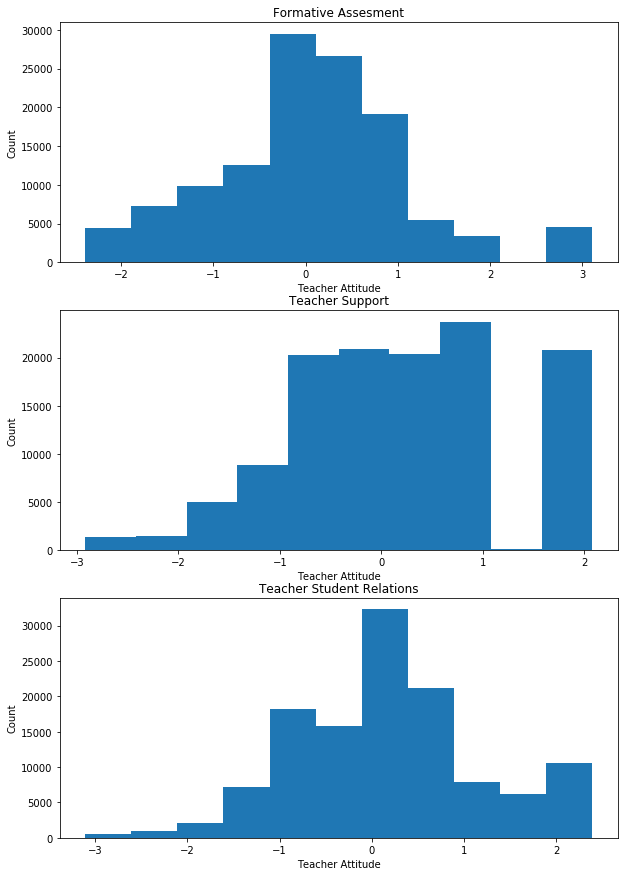

In [173]:
fig, ax = plt.subplots(nrows=3, figsize = [10,15])
binsize = 0.5
variables = ['Formative Assesment', 'Teacher Support', 'Teacher Student Relations']
for i in range(len(variables)):
    var = variables[i]
    bins = np.arange(min(df[var]), max(df[var])+binsize, binsize)
    ax[i].hist(data = df, x = var, bins = bins)
    ax[i].set_xlabel('Teacher Attitude')
    ax[i].set_ylabel('Count')
    ax[i].set_title('{}'.format(var))


> Teacher Support and Formative Assesment distribution have shifted toward left with two modes. Most students pretty much received some attention in some lessons in case of formative assesment such as . In case of teacher support, at least they got some sort of support in some lessons but also showing similar count where no support was present. Student teacher relationship looks normal distribution. Most answers falls in strongly disagreement to disagree zone. May be violin plot can enlight more in later section. 


> Let's look into socio economic cultural status of the students now.ESCS is used in many PISA reports and analyses, both as a control for the socio-economic status of students and schools and in bivariate correlations with performance as one of the main indicators of equity in an education system.

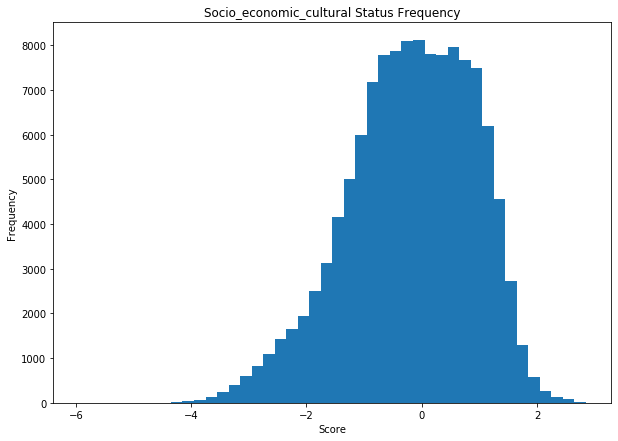

In [174]:
binsize = 0.2
bins = np.arange(df['Socio_economic_cultural Status'].min(), df['Socio_economic_cultural Status'].max()+binsize, binsize)

plt.figure(figsize=[10,7])
plt.hist(data = df, x = 'Socio_economic_cultural Status', bins = bins)
plt.xlabel('Score')
plt.ylabel('Frequency')
plt.title('Socio_economic_cultural Status Frequency')
plt.show()

> The distribution is skewed towards left.

In [175]:
df['Socio_economic_cultural Status'].describe()

count    122895.000000
mean         -0.187852
std           1.099970
min          -5.950000
25%          -0.900000
50%          -0.110000
75%           0.660000
max           2.780000
Name: Socio_economic_cultural Status, dtype: float64

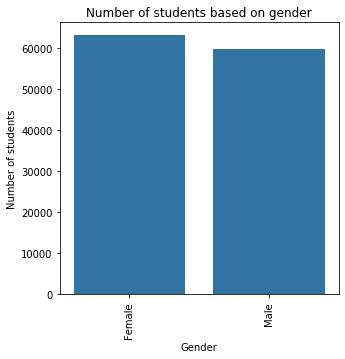

In [176]:

plt.figure(figsize = [5,5])
base_color = sb.color_palette()[0]
sb.countplot(data = df, x = 'Gender', color = base_color, order=df['Gender'].value_counts().index)
plt.title('Number of students based on gender')
plt.xticks(rotation='vertical');
plt.ylabel('Number of students');

### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?

> For 'Average Total Score', the distribution was strikingly normal. However, this was expected to an extent, since student grades typically fall along a bell curve. As a result, no unusual points stood out for this variable, nor did any stand out for the three scores that resulted in the total score. Therefore, no transformations were necessary to make sense of the data.

> Female students were greater than male counts.

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

> The secondary features investigated were Study Times, Learning Times, Socio_economic_cultural Status, Teacher Support, Formative Assesment, Teacher Student Relations, Gender of student and Country.

> For Study Times, the total had a strong right skew.To better understand this feature, we spread the total across a logarithmic scale to see if it was not in fact unimodal or to see any other irregularities. In the end, it ended up being unimodal and quite normal.

> As for the Learning Time, this data clearly had outliers, so for each of the Learning Time's, the outliers over 600 minutes were excluded. This was done to look at the more typical student results, and so that later plots will not be distorted by these exceptionally dedicated students.


## Bivariate Exploration

> In this section, I investigated relationships between pairs of variables in my
data. I start with heatmap and crrelation plot.

In [177]:
numeric_vars = ['Average Math Score', 'Average Reading Score', 'Average Science Score', 'Out_of_School Study Time','Learning Time Math','Learning Time Language','Learning Time Science','Socio_economic_cultural Status','Teacher Student Relations','Teacher Support','Formative Assesment']
categorical_vars = ['Country','Gender']

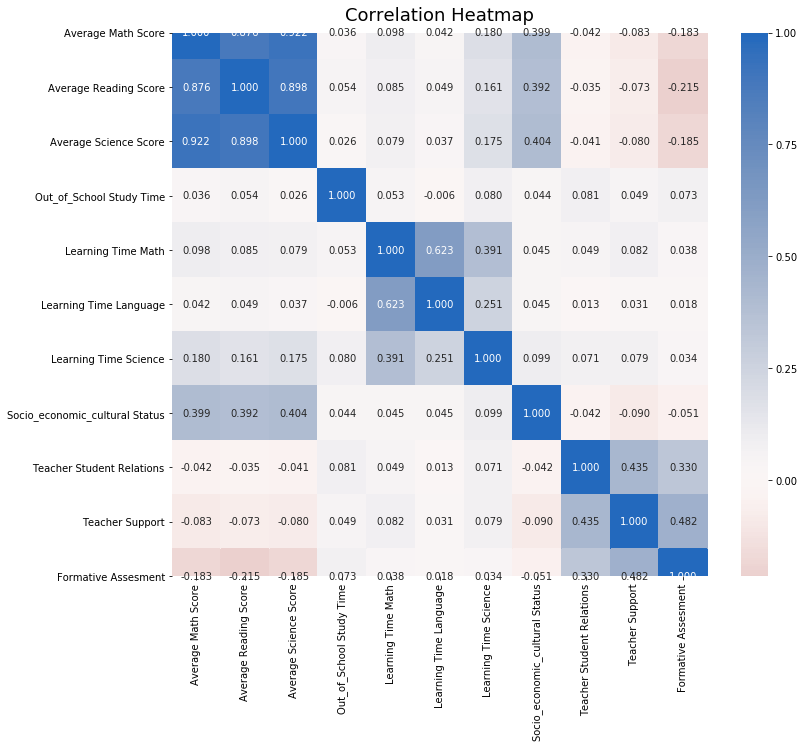

In [178]:
# Correlation plot
plt.figure(figsize = [12,10])
heatmap = sb.heatmap(df[numeric_vars].corr(), annot = True, fmt = '.3f',
           cmap = 'vlag_r', center = 0)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
plt.show()


* Surprisingly, study time outside school or learning time for each subject are poorly correlated with average scores for math, science and reading. Learning time is slightly better than outside school study time though.
* On the otherhand, socio-economic status shows moderate relation with average scores. 
* Teachers' practices and attitude  have negetive correlation coefficients with scores. Collectively, they are supposed to contribute to improve score but here the picture is opposite. This might be worth trying to explore more.

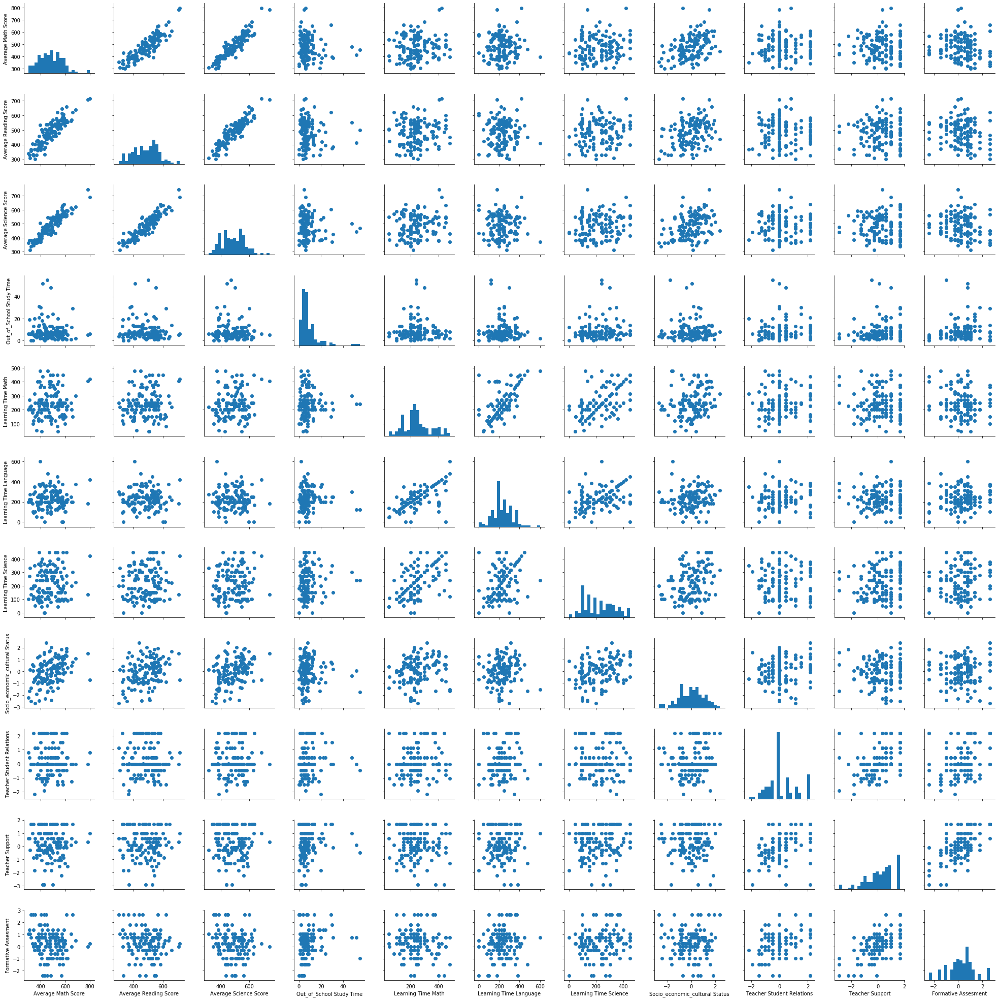

In [179]:
# plot matrix: sample 500 students so that plots are clearer and
# they render faster
samples = np.random.choice(df.shape[0], 500, replace = False)
df_samp = df.loc[samples,:]

g = sb.PairGrid(data = df_samp, vars = numeric_vars)
g = g.map_diag(plt.hist, bins = 20);
g.map_offdiag(plt.scatter);

Now I will look into gender profile and its effect on performance.

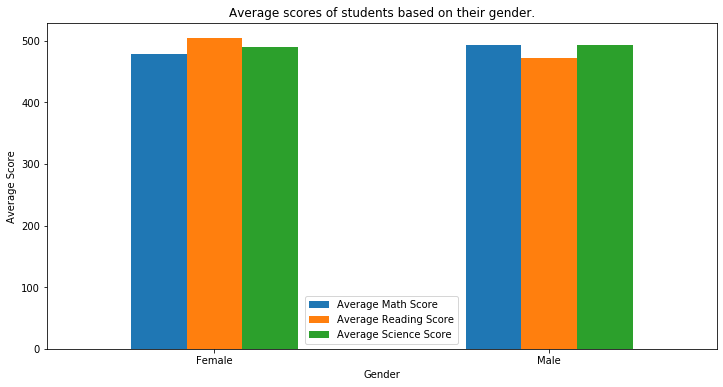

In [180]:
# Find average score based on gender
gender_group = df.groupby(['Gender']).mean()[['Average Math Score', 'Average Reading Score', 'Average Science Score']]
ax = gender_group.plot.bar(figsize=(12,6));
plt.title('Average scores of students based on their gender.')
plt.ylabel('Average Score')
plt.xticks(rotation='horizontal');

> Although the average scores are pretty close for male and felame, but Females have higher reading score on average than male students.

> Let's check with average scores individually per country.

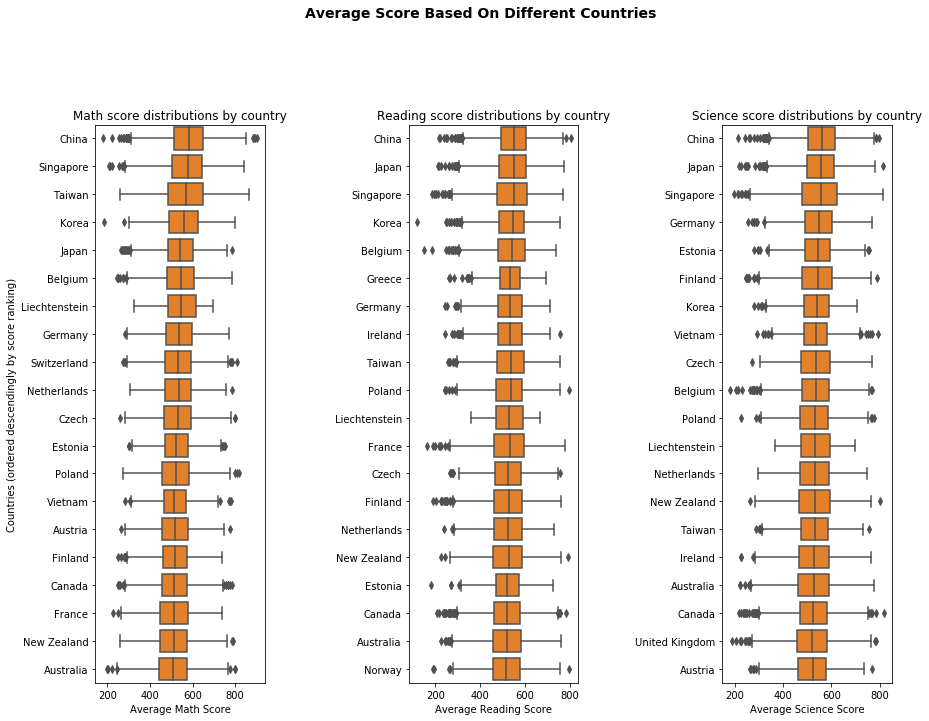

In [181]:
plt.figure(figsize = [14.27, 10.27])
plt.subplots_adjust(wspace = 0.85) # adjust spacing between subplots, in order to show long country names nicely
plt.suptitle("Average Score Based On Different Countries", y = 1.04,fontsize = 14, weight = "bold")
#plt.tight_layout();
math_score_country_order = df.groupby('Country')['Average Math Score'].mean().sort_values(ascending = False).index[:20]
reading_score_country_order = df.groupby('Country')['Average Reading Score'].mean().sort_values(ascending = False).index[:20]
science_score_country_order = df.groupby('Country')['Average Science Score'].mean().sort_values(ascending = False).index[:20]

plt.subplot(1, 3, 1)
sb.boxplot(y = df['Country'],x = df['Average Math Score'], order = math_score_country_order, color = sb.color_palette()[1]);
plt.ylabel('Countries (ordered descendingly by score ranking)')
plt.title('Math score distributions by country');

plt.subplot(1, 3, 2)
sb.boxplot( y = df['Country'],x = df['Average Reading Score'], order = reading_score_country_order, color = sb.color_palette()[1]);
plt.ylabel(''); # Remove the redundant label
plt.title('Reading score distributions by country');

plt.subplot(1, 3, 3)
sb.boxplot( y = df['Country'],x = df['Average Science Score'], order = science_score_country_order, color = sb.color_palette()[1]);
plt.ylabel(''); # Remove the redundant label
plt.title('Science score distributions by country');

> From the above plot of average math, science and rerading against the location, east asian countries are showing dominance. China is all along maintainting the highest average score. Japan is at second place for science and reading score where as Singapore is third. Singapore has second highes average math score.

> Among the top ten countries, Germany, Taiwan, Korea, Belgium, Finland, Greece, Poland, Netherlands, Switzerland,Liechtenstein, Ireland are also present.

> Indonesia, Peru, Qatar, Brazil and Argentina reamins in the worst five list.

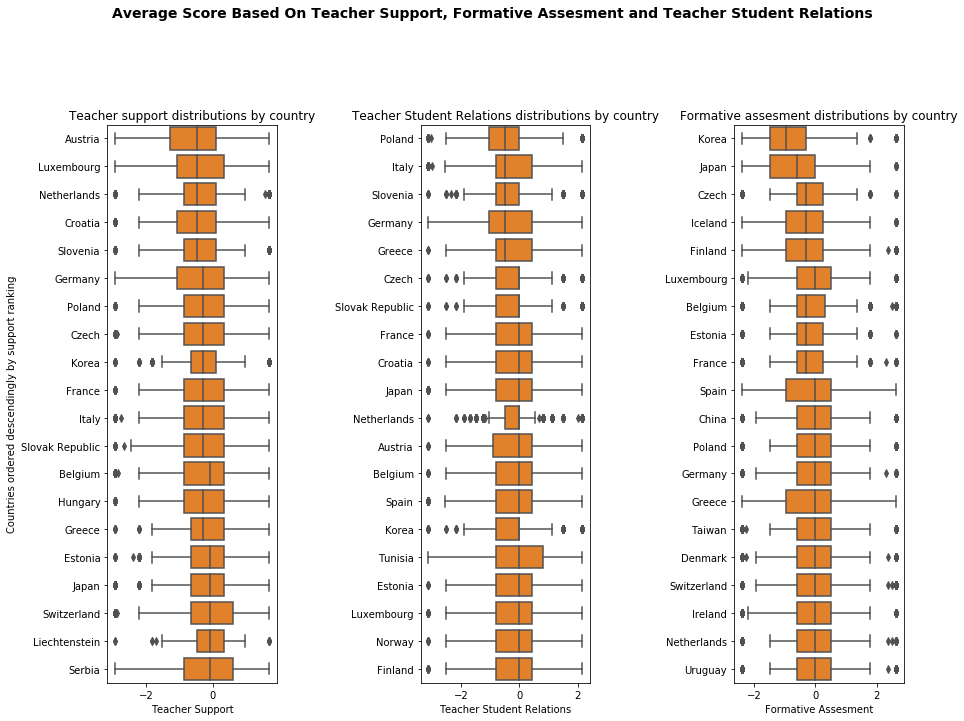

In [182]:
# Find out tecahers' attitude and practices based on location

plt.figure(figsize = [14.27, 10.27])
plt.subplots_adjust(wspace = 0.85) # adjust spacing between subplots, in order to show long country names nicely
plt.suptitle("Average Score Based On Teacher Support, Formative Assesment and Teacher Student Relations", y = 1.04,fontsize = 14, weight = "bold")
teacher_support_country_order = df.groupby('Country')['Teacher Support'].mean().sort_values(ascending = True).index[:20]
teacher_student_rel_country_order = df.groupby('Country')['Teacher Student Relations'].mean().sort_values(ascending = True).index[:20]
formative_assesment_country_order = df.groupby('Country')['Formative Assesment'].mean().sort_values(ascending = True).index[:20]

plt.subplot(1, 3, 1)
sb.boxplot(x = df['Teacher Support'], y = df['Country'], order = teacher_support_country_order, color = sb.color_palette()[1]);
plt.ylabel('Countries ordered descendingly by support ranking')
plt.title('Teacher support distributions by country');

plt.subplot(1, 3, 2)
sb.boxplot(x = df['Teacher Student Relations'], y = df['Country'], order = teacher_student_rel_country_order, color = sb.color_palette()[1]);
plt.ylabel(''); # Remove the redundant label
plt.title('Teacher Student Relations distributions by country');

plt.subplot(1, 3, 3)
sb.boxplot(x = df['Formative Assesment'], y = df['Country'], order = formative_assesment_country_order, color = sb.color_palette()[1]);
plt.ylabel(''); # Remove the redundant label
plt.title('Formative assesment distributions by country');

> So, the teachers' attitude and practices are not really dictating any better scoring. From the above plot, we see that the low scoring countries reflects higher teacher support(above 0), higher teacher student relations(1) and Formative assesment(between 0-1). This finding aligns with out previous exploration in correlation matrix plot where we saw negetive coefficient for all of the teachers' practices with average scores.

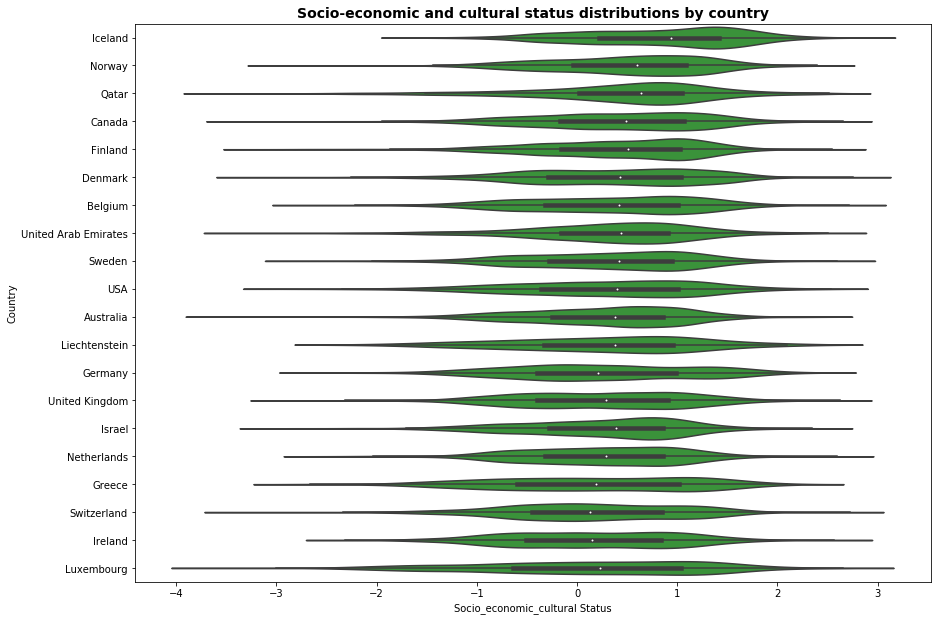

In [210]:
# Effect of socio-economic-cultural status on students' achievement

socio_econo_cultural_country_order = df.groupby('Country')['Socio_economic_cultural Status'].mean().sort_values(ascending = False).index[:20]

plt.figure(figsize = [14.27, 10.27])
sb.violinplot(x = df['Socio_economic_cultural Status'], y = df['Country'], order = socio_econo_cultural_country_order, color = sb.color_palette()[2]);
plt.ylabel('Country'); 
plt.title('Socio-economic and cultural status distributions by country',fontsize = 14, weight = "bold");

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

> From bivariate exploration, it is more confirmed that there is not so strong relationship among teachers' attitude and practices with score. Countries those performed lower score had better help from teachers compared to high scoring countries.

> Learning time and outside school study hours also do not show any strength in regard to average score. Analysis in later section may provide explanation. 

### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

> Regarding socio-economic status, European countries,North America, Australia along with few Asian countries such as Japan, Qatar, Korea, Israel are solvent.Interestingly, China is not among them even though it has average highest score in math, science and reading.

## Multivariate Exploration

> Here we will explore three variables at a time to find isight about the relationship among them. Here we will focus on top ten contries according to average scores. Then we will figure out how the geographic position and three other major variables such as outside of school study time, socio_economic_cutural status and teachers' practices and attitude influence students' achievement.

In [184]:
df_new.head()

,Country,Average Math Score,Average Reading Score,Average Science Score,Socio_economic_cultural Status,Out_of_School Study Time,Formative Assesment,Teacher Support
278705,Japan,636.94500,646.50988,680.93994,-0.21,10.0,-2.3919,-1.06
278708,Japan,691.15906,693.83384,729.33608,0.95,23.0,-0.5945,-0.47
278709,Japan,675.26874,621.00802,647.92990,0.24,16.0,-0.5945,0.11
278710,Japan,614.43370,639.90018,653.43156,0.77,3.0,-0.9632,0.11
278712,Japan,584.98984,602.01158,636.74002,0.40,25.0,-0.5945,-0.28


In [185]:
df_new.describe()

,Average Math Score,Average Reading Score,Average Science Score,Socio_economic_cultural Status,Out_of_School Study Time,Formative Assesment,Teacher Support
count,5281.000000,5281.000000,5281.000000,5281.000000,5281.000000,5281.000000,5281.000000
mean,555.005868,540.248186,546.162994,-0.110362,10.670896,-0.415855,0.003312
std,94.603672,90.534139,88.837152,0.799632,10.328928,1.078310,0.917947
min,182.746520,116.103380,197.724740,-5.020000,0.000000,-2.391900,-2.920000
25%,490.660540,481.753020,487.728460,-0.700000,3.000000,-0.963200,-0.470000
50%,557.804960,548.633960,552.349880,-0.080000,8.000000,-0.285900,-0.090000
75%,623.625180,603.203060,608.299160,0.510000,15.000000,0.250900,0.610000
max,842.818180,774.580500,815.031720,2.550000,85.000000,2.629500,1.680000


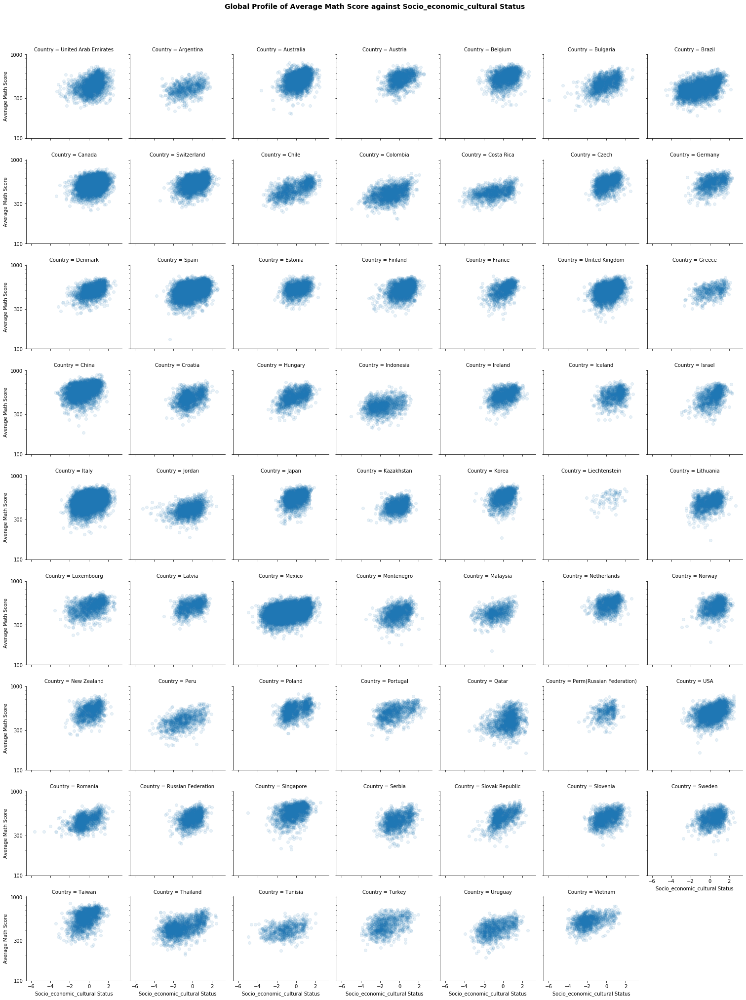

In [186]:
# Find out average math score vs socio economic cultural status for different countries

g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 7, size = 3,palette = 'vlag')
                 
g.map(plt.scatter,'Socio_economic_cultural Status','Average Math Score',alpha = 1/10)
g.set(yscale = 'log') # need to set scaling before customizing ticks
y_ticks = [100, 300, 1000]
g.set(yticks = y_ticks, yticklabels = y_ticks)
plt.suptitle("Global Profile of Average Math Score against Socio_economic_cultural Status", y = 1.04, fontsize = 14,weight = 'bold');

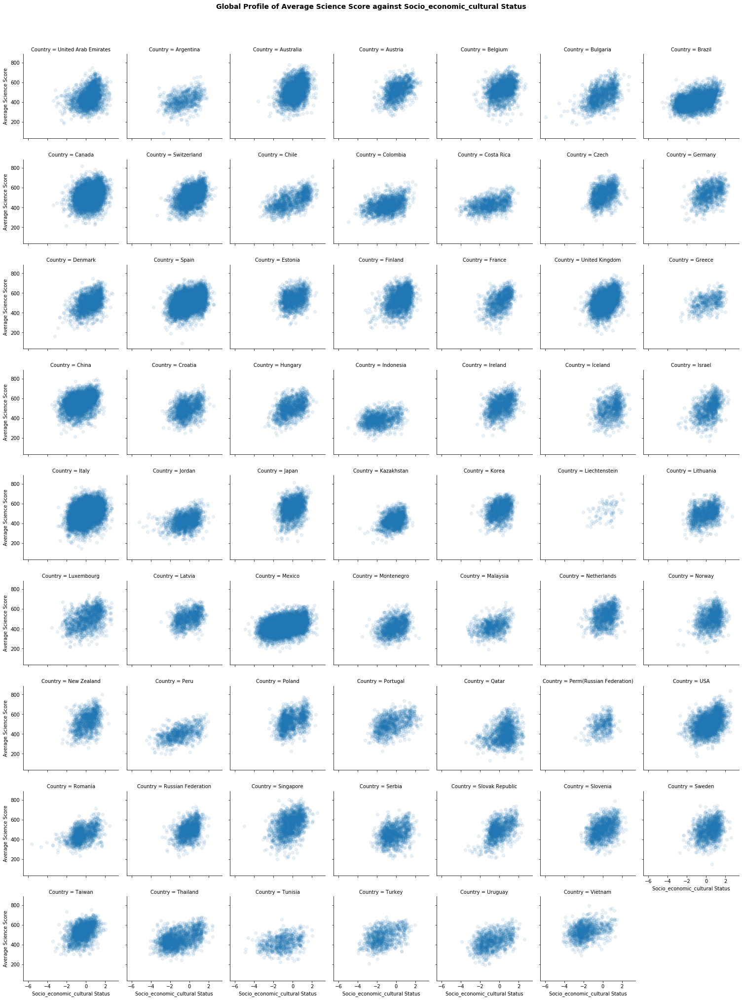

In [187]:
# Find out average science score vs socio economic cultural status for different countries

g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 7,size = 3)
                  
#g.map(sb.regplot,'Socio_economic_cultural Status','Average Science Score')
g.map(plt.scatter, 'Socio_economic_cultural Status','Average Science Score',alpha = 1/10)
g.set_xlabels('Socio_economic_cultural Status')
g.set_ylabels('Average Science Score')
plt.suptitle("Global Profile of Average Science Score against Socio_economic_cultural Status", y = 1.04, fontsize = 14,weight = 'bold');

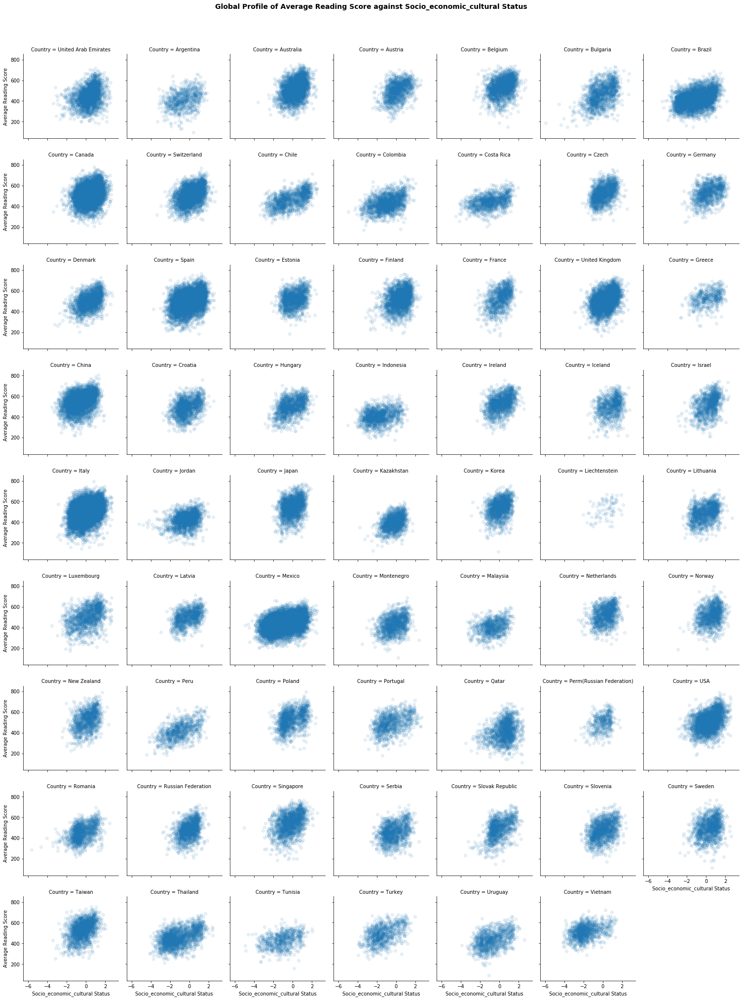

In [188]:
## Find out average reading score vs socio economic cultural status for different countries
g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 7,size = 3,palette = 'vlag')
                  
g.map(plt.scatter,'Socio_economic_cultural Status','Average Reading Score',alpha = 1/10)
g.set_xlabels('Socio_economic_cultural Status')
g.set_ylabels('Average Reading Score')
plt.suptitle("Global Profile of Average Reading Score against Socio_economic_cultural Status", y = 1.04, fontsize = 14,weight = 'bold');

In [189]:
def hist2dgrid(x, y, **kwargs):
    """ Quick hack for creating heat maps with seaborn's PairGrid. """
    palette = kwargs.pop('color')
    bins_y = np.arange(100, 800+50,100)
    bins_x = np.arange(-6, 4+0.5, 0.5)
    plt.hist2d(x, y, bins = [bins_x, bins_y], cmap = palette, cmin = 0.5)

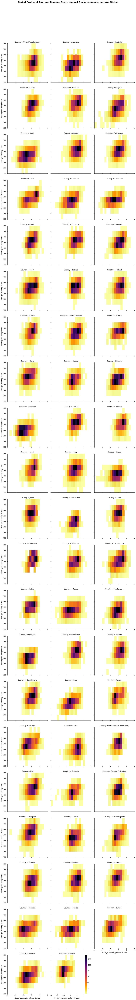

In [190]:
# create faceted heat maps on levels of the Socio_economic_cultural Status variable
g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 3, height = 4)
g.map(hist2dgrid, 'Socio_economic_cultural Status','Average Reading Score', color = 'inferno_r')
g.set_xlabels('Socio_economic_cultural Status')
g.set_ylabels('Average Reading Score')
plt.suptitle("Global Profile of Average Reading Score against Socio_economic_cultural Status", y = 1.04, fontsize = 14,weight = 'bold')
plt.colorbar()
plt.show();

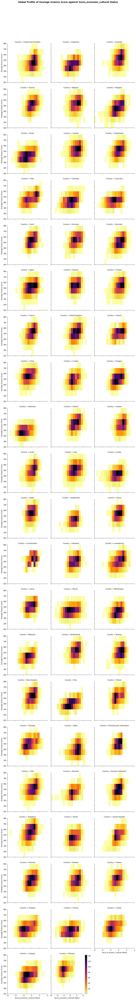

In [191]:
# create faceted heat maps on levels of the cut variable
g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 3, height = 4)
g.map(hist2dgrid, 'Socio_economic_cultural Status','Average Science Score', color = 'inferno_r')
g.set_xlabels('Socio_economic_cultural Status')
g.set_ylabels('Average Science Score')
plt.colorbar()
plt.suptitle("Global Profile of Average Science Score against Socio_economic_cultural Status", y = 1.04, fontsize = 14,weight = 'bold')
plt.show()

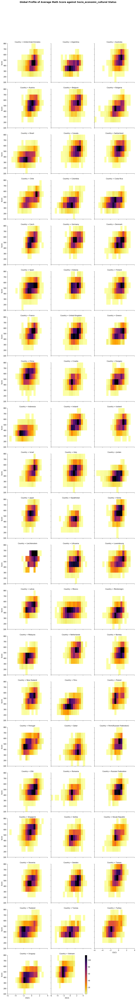

In [192]:
# create faceted heat maps on levels of the cut variable
g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 3, height = 4)
g.map(hist2dgrid, 'Socio_economic_cultural Status','Average Math Score', color = 'inferno_r')
g.set_xlabels('ESCS')
g.set_ylabels('Score')
plt.colorbar()
plt.suptitle("Global Profile of Average Math Score against Socio_economic_cultural Status", y = 1.04, fontsize = 14,weight = 'bold')
plt.show()

> Next step of exploration is to find out study hours outside school and its impact on average score by country.

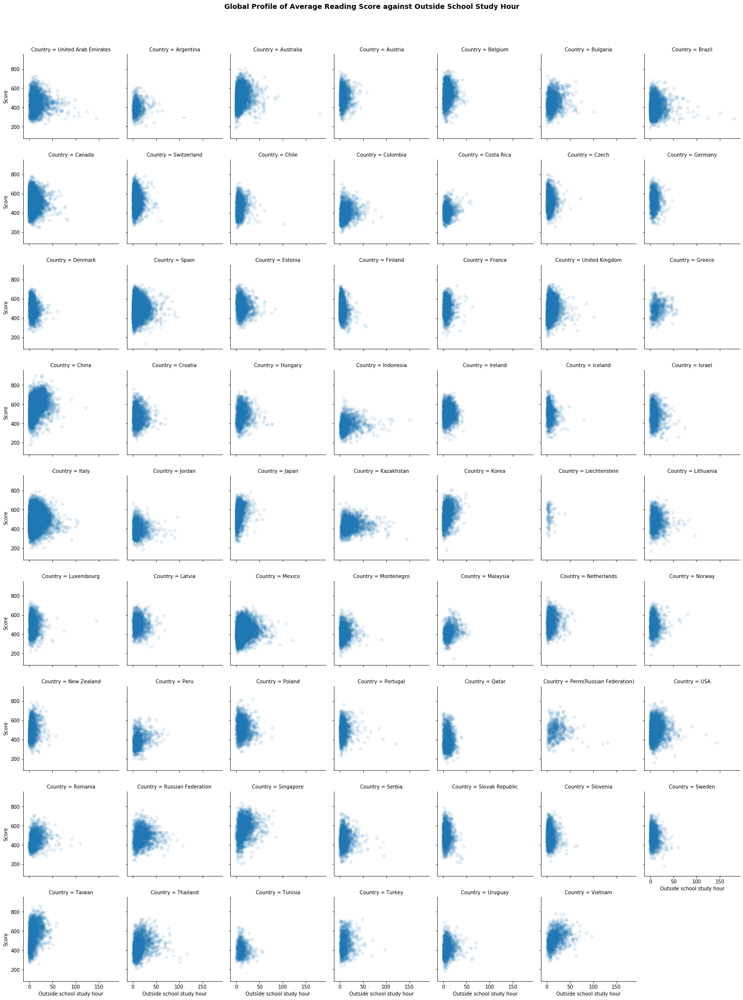

In [193]:
g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 7,size = 3,palette = 'vlag')
                  
g.map(plt.scatter,'Out_of_School Study Time','Average Math Score',alpha = 1/10)
g.set_xlabels('Outside school study hour')
plt.suptitle("Global Profile of Average Reading Score against Outside School Study Hour", y = 1.04, fontsize = 14,weight = 'bold')
g.set_ylabels('Score');

> May be log transformation of both axes can display better relationship since most of the data points are cluttred between 0 to 50 hrs. 

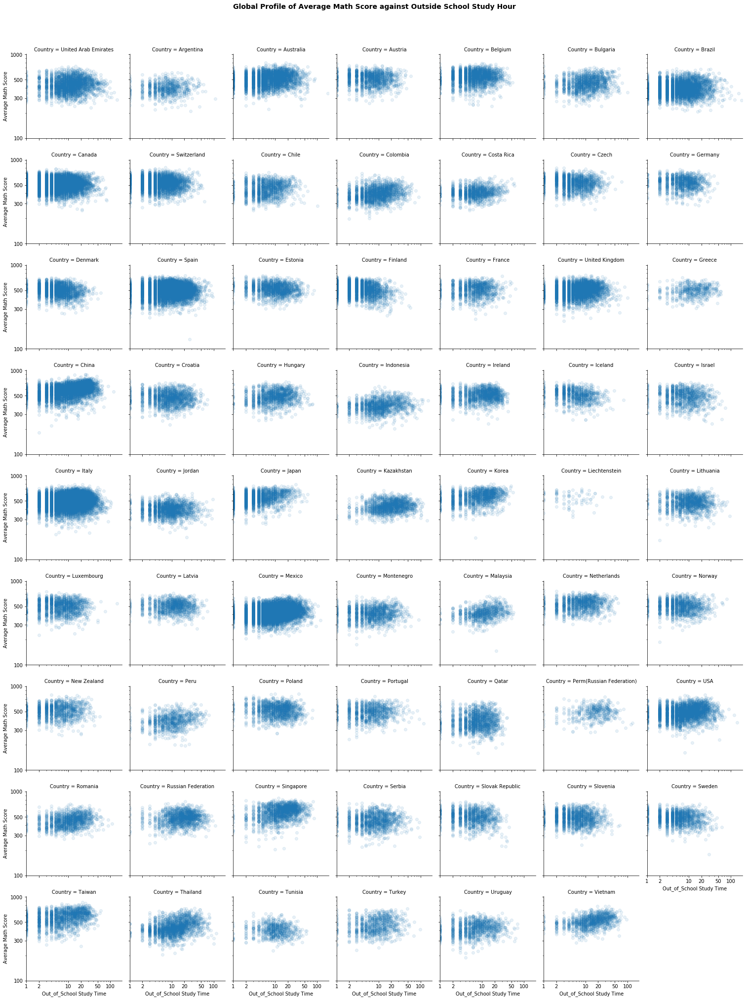

In [194]:
# Log transformation of both axes
g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 7,size = 3,palette = 'vlag')
                  
g.map(plt.scatter,'Out_of_School Study Time','Average Math Score',alpha = 1/10)

g.set(xscale = 'log') # need to set scaling before customizing ticks
g.set(yscale = 'log')
y_ticks = [100,300,500,1000]
x_ticks = [1,2,10,20,50,100]
g.set(xticks = x_ticks, xticklabels = x_ticks,yticks = y_ticks,yticklabels = y_ticks )
plt.suptitle("Global Profile of Average Math Score against Outside School Study Hour", y = 1.04, fontsize = 14,weight = 'bold');

> Again, the log transformation of average math scores against outside school study hours does not really reflect any picture of strong relationship. Across the countries, average math score has similar range of scores even though they spent long or short hours. 

>For simplicity of visualization, let's take top five countries to show.

In [195]:
#redefine dataset with our choice of variables
top_five_countries = ['China','Japan','Singapore','Taiwan','Korea']
df_new = df[['Country', 'Average Math Score', 'Average Reading Score', 'Average Science Score','Socio_economic_cultural Status','Out_of_School Study Time','Formative Assesment','Teacher Support']][df['Country'].isin(top_five_countries)]

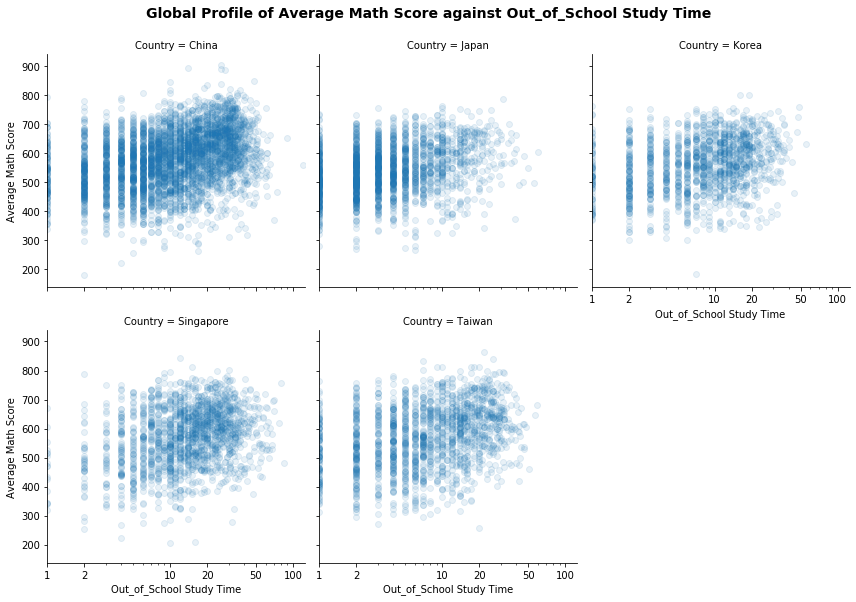

In [196]:
# Log transformation of both axes
g = sb.FacetGrid(data = df_new, col = 'Country', col_wrap = 3,size = 4,palette = 'vlag')
                  
g.map(plt.scatter,'Out_of_School Study Time','Average Math Score',alpha = 1/10)
g.set(xscale = 'log') # need to set scaling before customizing ticks
x_ticks = [1,2,10,20,50,100]
g.set(xticks = x_ticks, xticklabels = x_ticks )
plt.suptitle("Global Profile of Average Math Score against Out_of_School Study Time", y = 1.04, fontsize = 14,weight = 'bold');

> Let's finalise the analyse with teachers' attitude and practices.

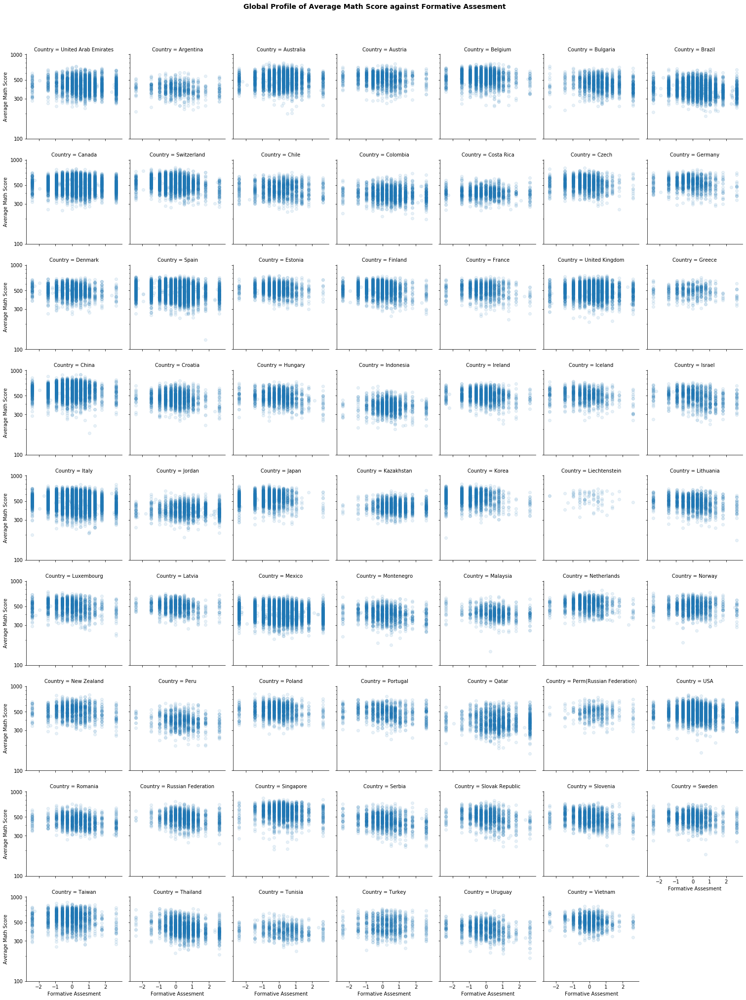

In [197]:
# Find tecahers' attitude and their impact on average math score
g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 7,size = 3,palette = 'vlag')
                  
g.map(plt.scatter,'Formative Assesment','Average Math Score',alpha = 1/10) #Formative assesment
g.set(yscale = 'log')
y_ticks = [100,300,500,1000]
#x_ticks = [0.01,0.03,0.1,0.3,0.6,1,3]
g.set(yticks = y_ticks,yticklabels = y_ticks )
plt.suptitle("Global Profile of Average Math Score against Formative Assesment", y = 1.04, fontsize = 14,weight = 'bold');

> Looks like Formative Assesment does not impact the performance as well. All ranges of formative assesment achieved more or similar score across the counties.

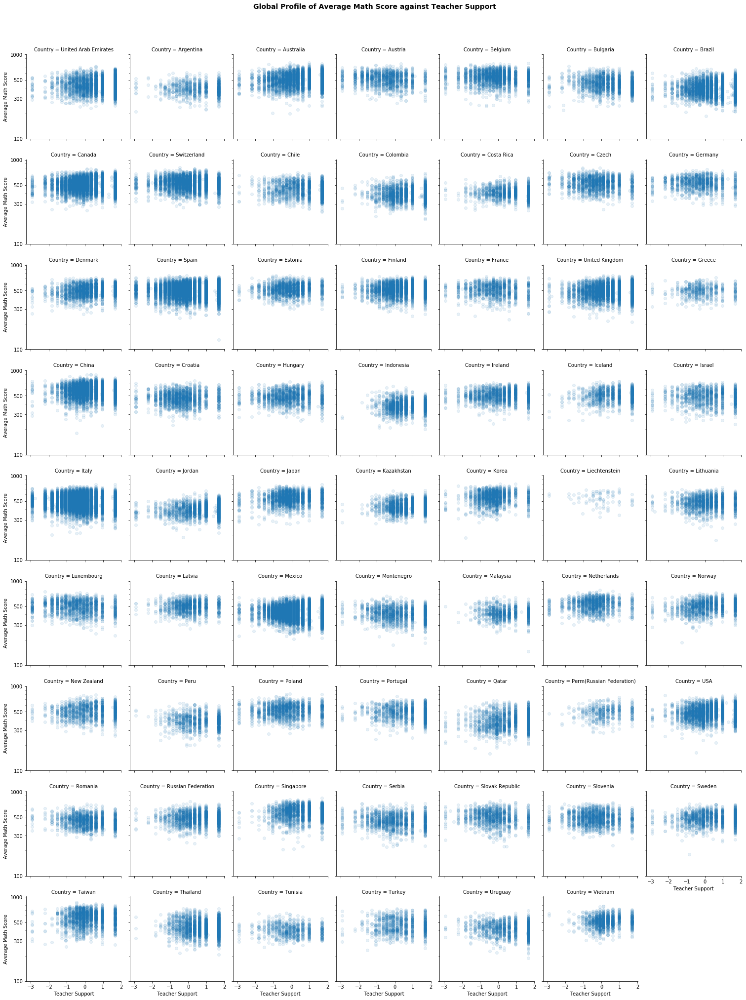

In [198]:
#Find the impact of teacher support on average math score
g = sb.FacetGrid(data = df, col = 'Country', col_wrap = 7,size = 3,palette = 'vlag')
                  
g.map(plt.scatter,'Teacher Support','Average Math Score',alpha = 1/10) # Teacher support

#g.set(xscale = 'log') # need to set scaling before customizing ticks
g.set(yscale = 'log')
y_ticks = [100,300,500,1000]
#x_ticks = [1,2,10,20,50,100]
g.set(yticks = y_ticks,yticklabels = y_ticks )
plt.suptitle("Global Profile of Average Math Score against Teacher Support", y = 1.04, fontsize = 14,weight = 'bold');

>For simplicity of visualization, let's take top five countries to show.

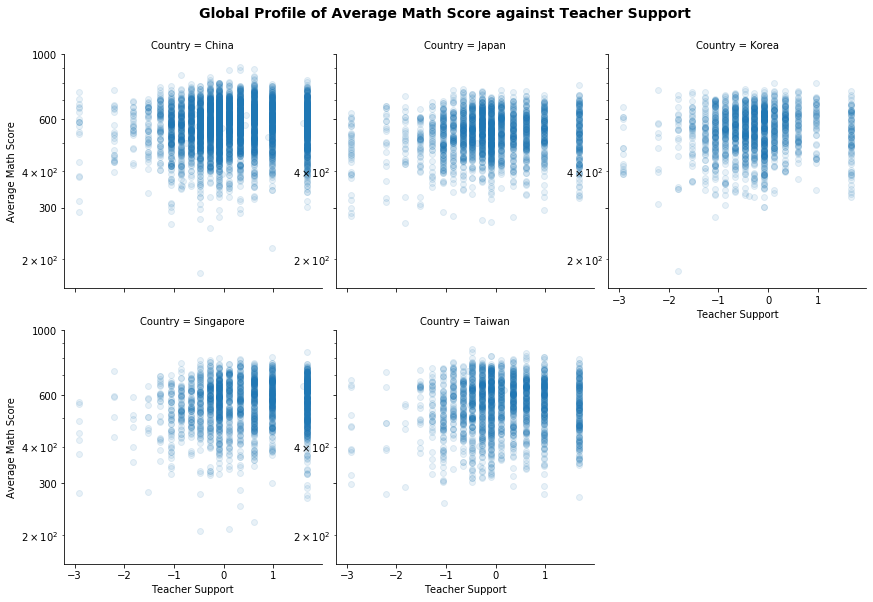

In [209]:
#Find the impact of teacher support on average math score
g = sb.FacetGrid(data = df_new, col = 'Country', col_wrap = 3,size = 4,palette = 'vlag')                  
g.map(plt.scatter,'Teacher Support','Average Math Score',alpha = 1/10) # Teacher support
y_ticks = [300,600,1000]
g.set(yscale = 'log')
g.set(yticks = y_ticks,yticklabels = y_ticks )
plt.suptitle("Global Profile of Average Math Score against Teacher Support", y = 1.04, fontsize = 14,weight = 'bold');

>For simplicity of visualization, let's take top five countries to show.

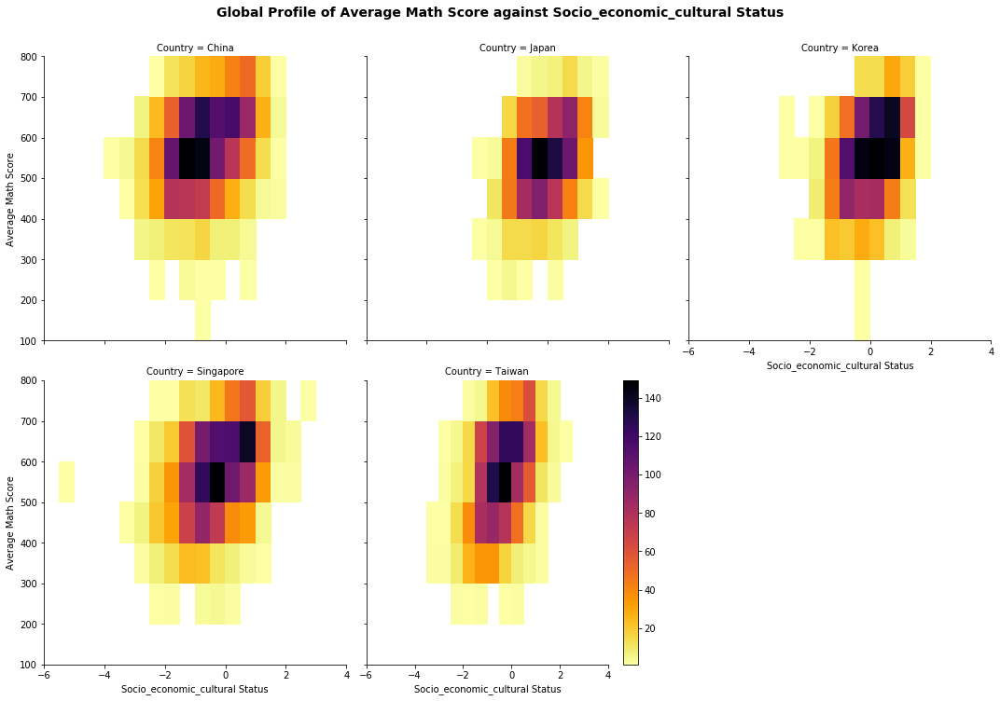

In [200]:

# create faceted heat maps on Socio_economic_cultural Status variable
g = sb.FacetGrid(data = df_new, col = 'Country', col_wrap = 3, height = 5)
g.map(hist2dgrid, 'Socio_economic_cultural Status','Average Math Score', color = 'inferno_r')
g.set_xlabels('Socio_economic_cultural Status')
g.set_ylabels('Average Math Score')
plt.colorbar()
plt.suptitle("Global Profile of Average Math Score against Socio_economic_cultural Status", y = 1.04, fontsize = 14,weight = 'bold')
plt.show();

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?

> In this part, it is visible that irrespective of country, the better socio_economic_cultural status resulted higher score in Math. Although we did log transformation to observe clear relationship between features, the observation remained same.
> Science and Reading score follow the similar pattern. 
> The heatmap clarifes how the high scorer are associated with socio_economic_cultural status for all of the countries. Although the count is small for score above 700, top scoring countries like China, Japan, Taiwan, Australia and European countries hold the trend.

### Were there any interesting or surprising interactions between features?

> As we explored in previous sections that outside school study times has no impact on performance and this is really surprising.